In [ ]:
import torch
import torch.nn as nn
from tqdm.auto import tqdm

from torchvision.utils import make_grid



import numpy as np
import os
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import models, transforms, datasets

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [ ]:
class DownSample(nn.Module):
    def __init__(self, Input_Channels, Output_Channels):
        super(DownSample, self).__init__()
        self.model = nn.Sequential(
                     nn.Conv2d(Input_Channels, Output_Channels, 4, 2, 1, bias=False),
                     nn.LeakyReLU(0.2)
                     )

    def forward(self, x):
        down = self.model(x)
        return down


class Upsample(nn.Module):
    def __init__(self, Input_Channels, Output_Channels):
        super(Upsample, self).__init__()

        self.model = nn.Sequential(
                     nn.ConvTranspose2d(Input_Channels, Output_Channels, 4, 2, 1, bias=False),
                     nn.InstanceNorm2d(Output_Channels),
                     nn.ReLU(inplace=True),)

    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1)
        return x


class Generator(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(Generator, self).__init__()

        self.down1 = DownSample(in_channels, 64)
        self.down2 = DownSample(64, 128)
        self.down3 = DownSample(128, 256)
        self.down4 = DownSample(256, 512)
        self.down5 = DownSample(512, 512)
        self.down6 = DownSample(512, 512)
        self.down7 = DownSample(512, 512)
        self.down8 = DownSample(512, 512)

        self.up1 = Upsample(512, 512)
        self.up2 = Upsample(1024, 512)
        self.up3 = Upsample(1024, 512)
        self.up4 = Upsample(1024, 512)
        self.up5 = Upsample(1024, 256)
        self.up6 = Upsample(512, 128)
        self.up7 = Upsample(256, 64)

        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, 1, 4, padding=1), # out_channels
            nn.Tanh(),
        )

    def forward(self, x):
        # U-Net generator with skip connections from encoder to decoder

        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)
        u8 = self.final(u7)
        return u8

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=1):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(in_channels * 2, 64, 4, 2, 1, bias=False),  # Adjusted input channels
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        # Ensure both images have the same size along dimension 1
        if img_A.size(2) != img_B.size(2):
            img_A = F.interpolate(img_A, size=(img_B.size(2), img_B.size(3)), mode='nearest')

        # Concatenate the images on their channels
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)


In [ ]:
# Instantiate the Generator
generator = Generator(in_channels=1, out_channels=1)  # Adjusted for grayscale images
image = torch.rand((1, 1, 512, 512))  # Input image tensor
output_image = generator(image)  # Generate output image
print("Generator Output Shape:", output_image.shape)

# Instantiate the Discriminator
discriminator = Discriminator(in_channels=1)  # Adjusted for grayscale images
image1 = torch.rand((1, 1, 512, 512))  # Input image tensor 1
image2 = torch.rand((1, 1, 512, 512))  # Input image tensor 2
output_decision = discriminator(image1,image2)  # Discriminator decision (only takes one image as input)
print("Discriminator Output Shape:", output_decision.shape)

Generator Output Shape: torch.Size([1, 1, 512, 512])
Discriminator Output Shape: torch.Size([1, 1, 32, 32])


In [ ]:
# Import necessary libraries
import os
import torch
import torchvision.transforms as transforms
from PIL import Image
from torch.utils.data import Dataset

class CustomImageFolder(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.images = sorted(os.listdir(root))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = os.path.join(self.root, self.images[idx])
        image = Image.open(image_path)

        # Convert the image to grayscale
        if len(image.size) == 3:
            image = image.convert('L')

        if self.transform:
            image = self.transform(image)

        return image

# Define the directory containing training images
train_dir = "/content/drive/MyDrive/Cyclone images/CombinedDataset/Top/"

data_transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# Create a custom dataset instance for training
dataset_train = CustomImageFolder(root=train_dir, transform=data_transform)

# Define batch size
batch_size = 16

# Create a dataloader for training dataset
dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True, num_workers=2)

In [ ]:

print(len(dataset_train))
# print(len(dataset_val))

150


In [ ]:
def print_images(image_tensor, num_images):

    images = DeNormalize(image_tensor)
    images = images.detach().cpu()
    image_grid = make_grid(images[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
images = next(iter(dataloader_train))
print(images.shape)

torch.Size([16, 1, 512, 1024])


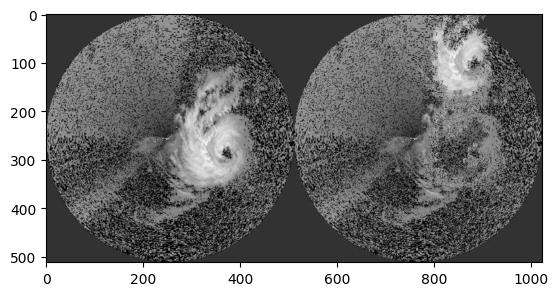

In [ ]:
def DeNormalize(tensor_of_image):
    return (tensor_of_image * 0.5 + 0.5).squeeze(0)
# Assuming images is a tensor of images
for image in images:
    denormalized_image = DeNormalize(image.squeeze(0))
    plt.imshow(denormalized_image, cmap='gray')
    plt.show()
    break

In [ ]:
loss_comparison = nn.BCEWithLogitsLoss()
L1_loss = nn.L1Loss()

In [ ]:
def discriminator_training(inputs, targets, discriminator_opt):

    # Ensure inputs and targets are on the same device as the discriminator
    inputs = inputs.to(device)
    targets = targets.to(device)

    discriminator_opt.zero_grad()

    # Passing real image and getting loss
    output = discriminator(inputs, targets)
    label = torch.ones_like(output, dtype=torch.float, device=device)
    real_loss = loss_comparison(output, label)

    # Passing Generated image and getting loss
    gen_image = generator(inputs).detach()
    fake_output = discriminator(inputs, gen_image)
    fake_label = torch.zeros_like(fake_output, dtype=torch.float, device=device)
    fake_loss = loss_comparison(fake_output, fake_label)

    Total_loss = (real_loss + fake_loss) / 2

    Total_loss.backward()

    discriminator_opt.step()

    return Total_loss


In [ ]:
def generator_training(inputs,targets, generator_opt, L1_lambda):

            generator_opt.zero_grad()

            generated_image = generator(inputs)

            disc_output = discriminator(inputs, generated_image)
            desired_output = torch.ones(size = disc_output.shape, dtype=torch.float, device=device)

            generator_loss = loss_comparison(disc_output, desired_output) + L1_lambda * torch.abs(generated_image-targets).sum()
            generator_loss.backward()
            generator_opt.step()

            return generator_loss, generated_image


In [ ]:
L1_lambda = 100
NUM_EPOCHS= 120
lr=0.0002
beta1=0.5
beta2=0.999
device = 'cuda'

In [ ]:
# Create optimizers for discriminator and generator
discriminator_opt = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))
generator_opt = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))

# Move models to the specified device
discriminator = discriminator.to(device)
generator = generator.to(device)

Training epoch 1


  0%|          | 0/10 [00:01<?, ?it/s]

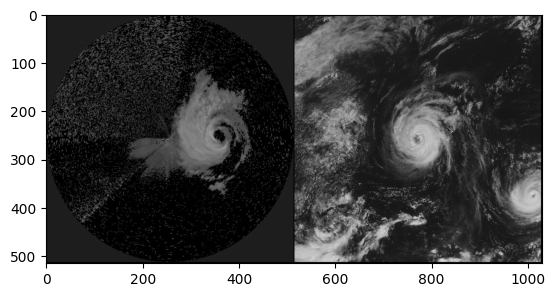

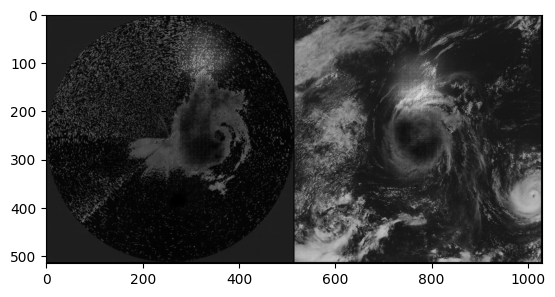

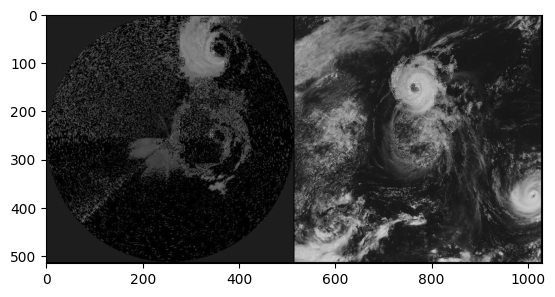

>Saved generator model: generator_epoch0.pth
Training epoch 2


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 3


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 4


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 5


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 6


  0%|          | 0/10 [00:00<?, ?it/s]

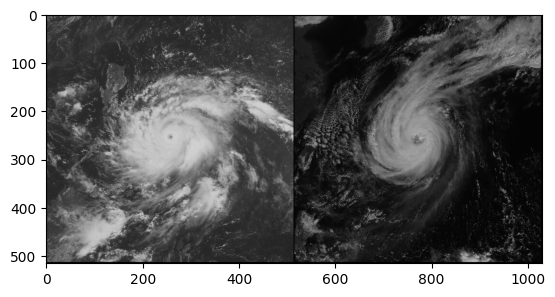

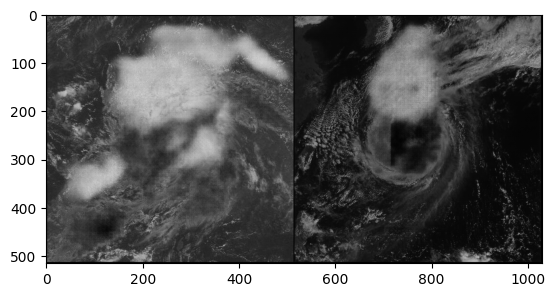

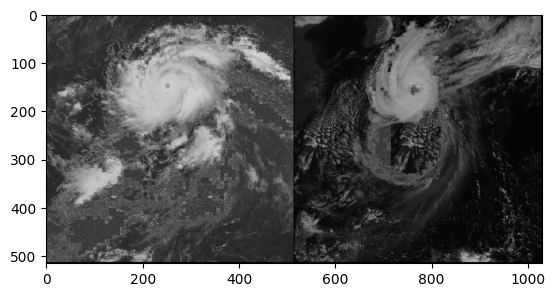

Training epoch 7


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 8


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 9


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 10


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 11


  0%|          | 0/10 [00:00<?, ?it/s]

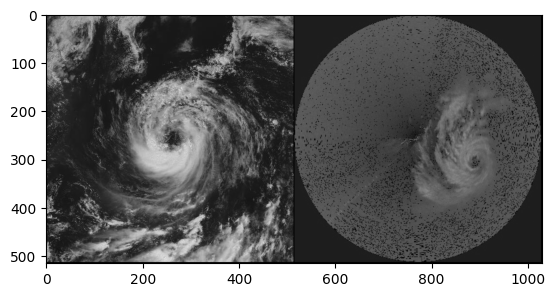

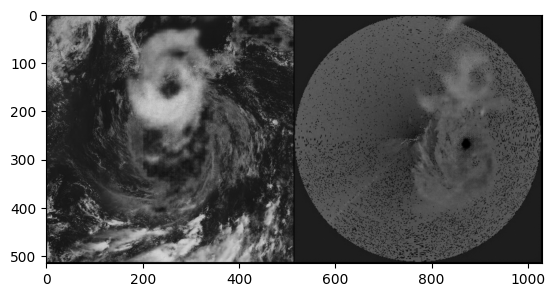

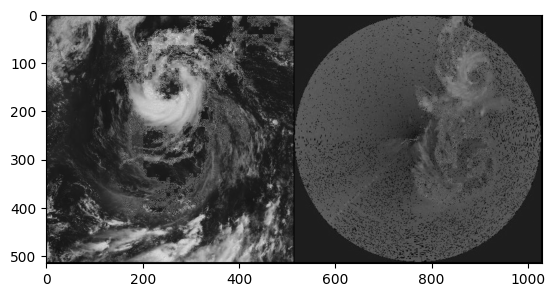

Training epoch 12


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 13


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 14


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 15


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 16


  0%|          | 0/10 [00:00<?, ?it/s]

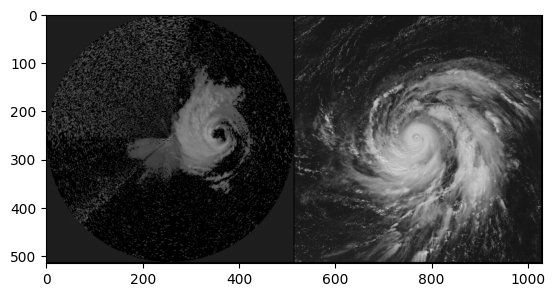

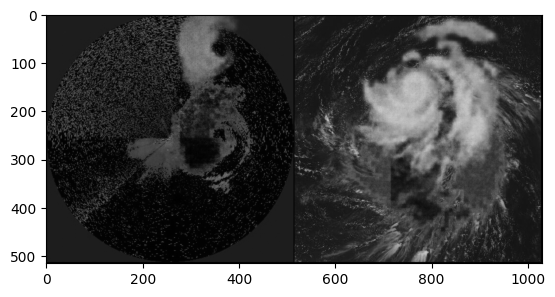

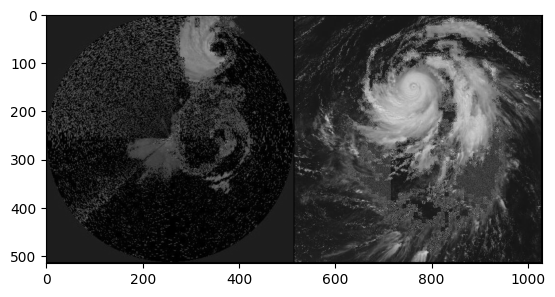

Training epoch 17


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 18


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 19


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 20


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 21


  0%|          | 0/10 [00:00<?, ?it/s]

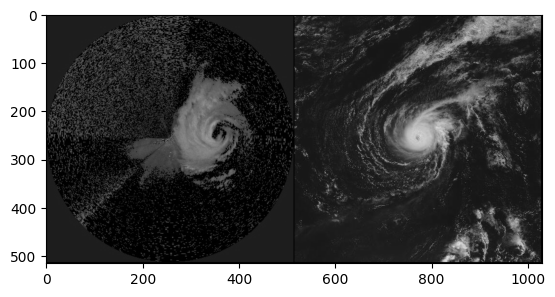

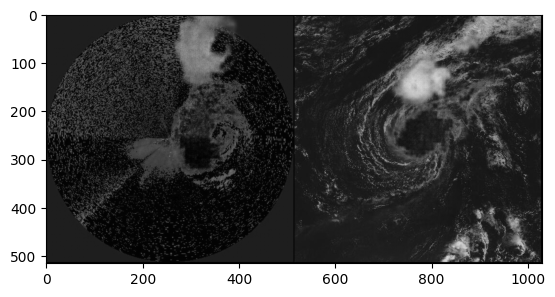

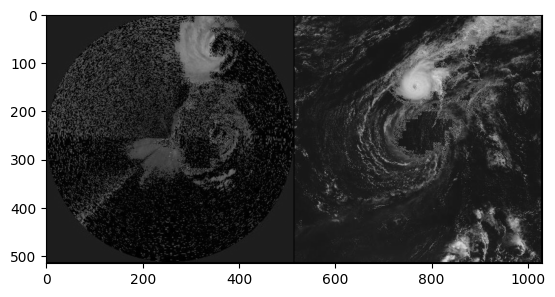

Training epoch 22


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 23


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 24


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 25


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 26


  0%|          | 0/10 [00:00<?, ?it/s]

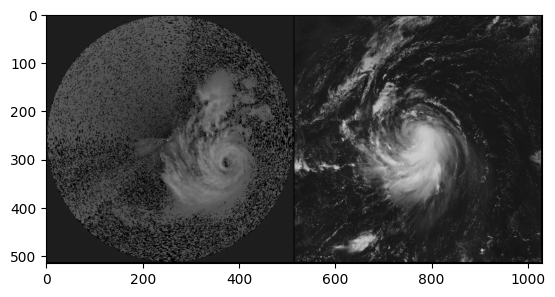

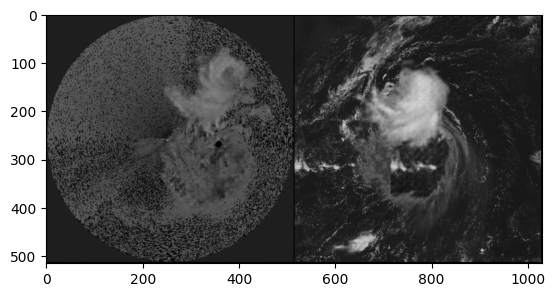

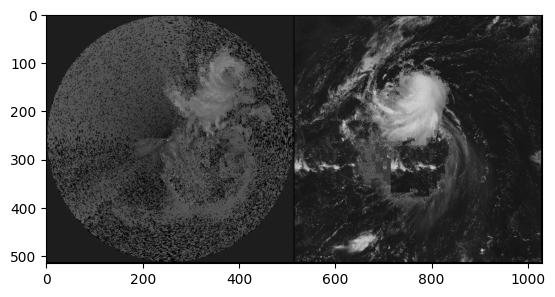

Training epoch 27


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 28


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 29


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 30


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 31


  0%|          | 0/10 [00:00<?, ?it/s]

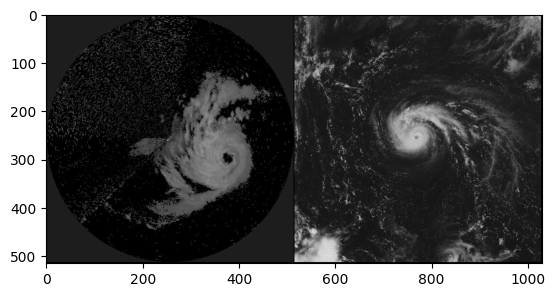

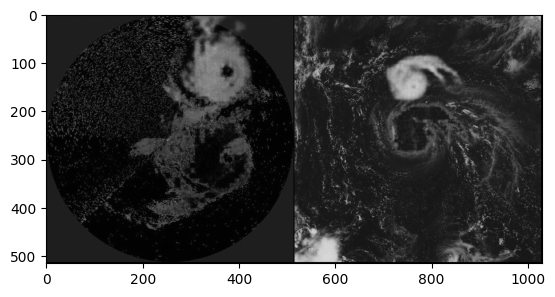

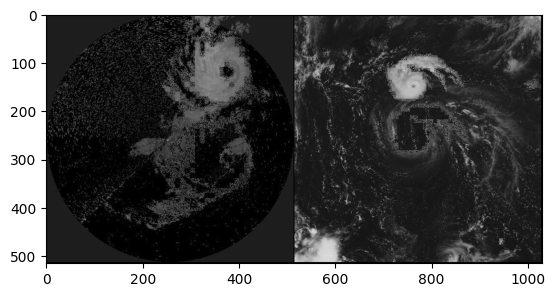

Training epoch 32


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 33


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 34


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 35


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 36


  0%|          | 0/10 [00:00<?, ?it/s]

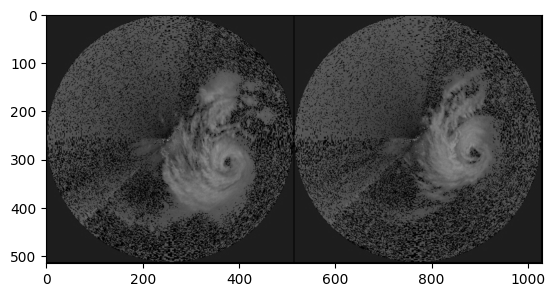

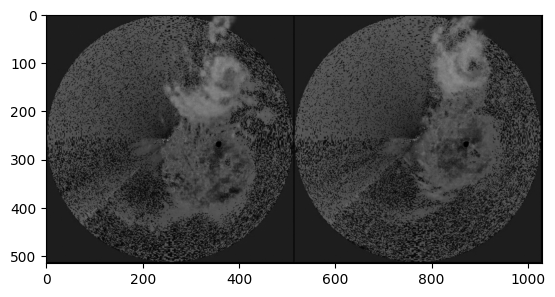

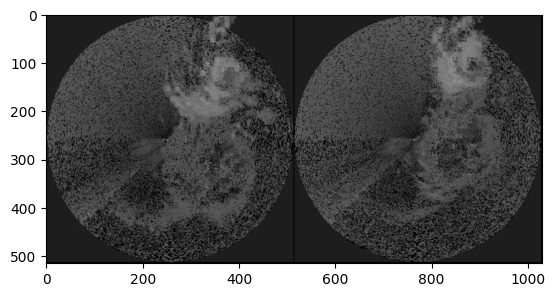

Training epoch 37


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 38


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 39


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 40


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 41


  0%|          | 0/10 [00:00<?, ?it/s]

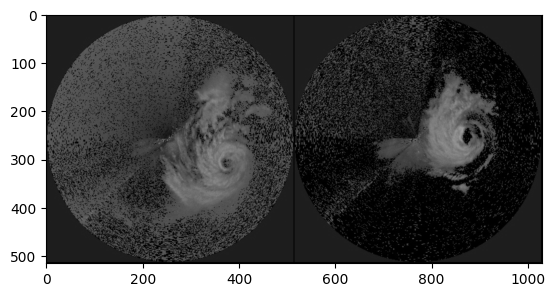

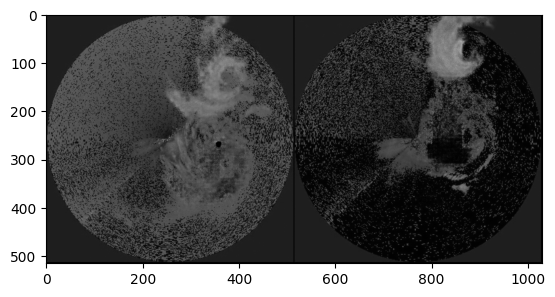

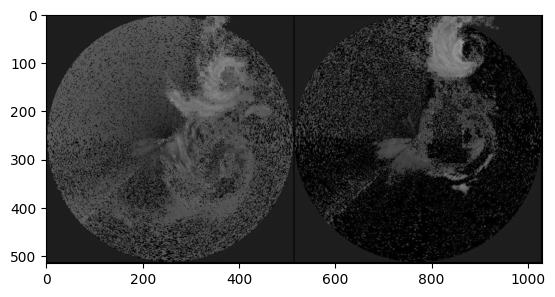

>Saved generator model: generator_epoch40.pth
Training epoch 42


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 43


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 44


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 45


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 46


  0%|          | 0/10 [00:00<?, ?it/s]

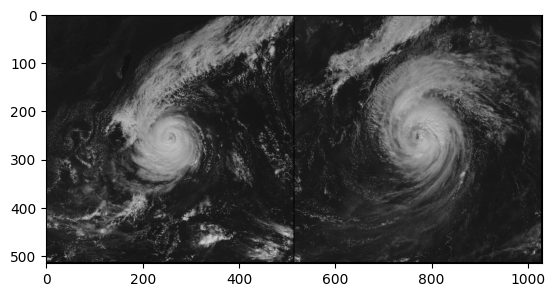

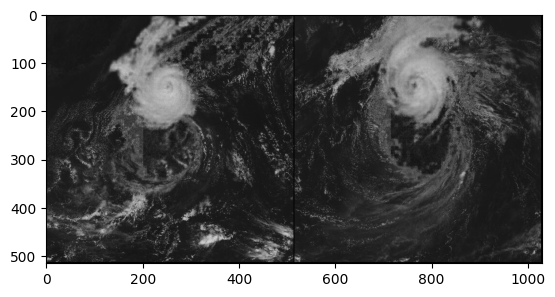

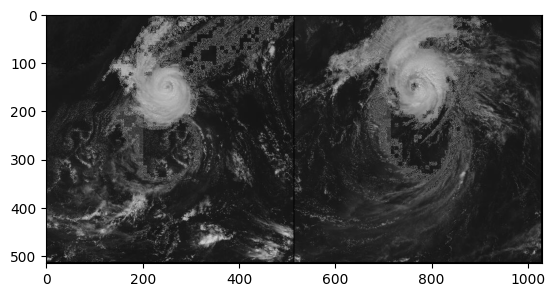

Training epoch 47


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 48


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 49


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 50


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 51


  0%|          | 0/10 [00:00<?, ?it/s]

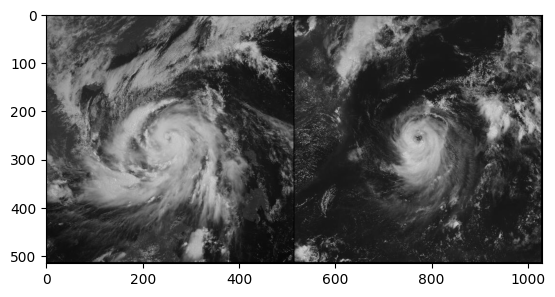

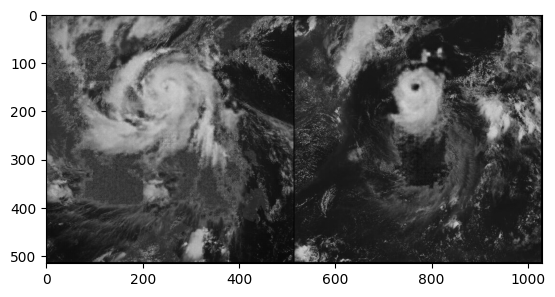

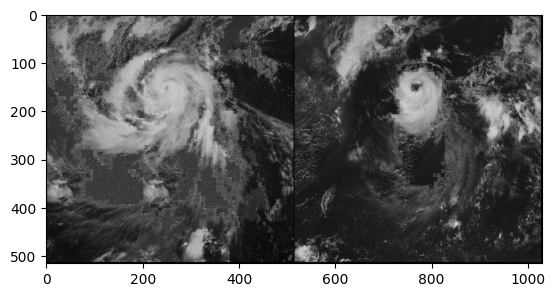

Training epoch 52


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 53


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 54


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 55


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 56


  0%|          | 0/10 [00:00<?, ?it/s]

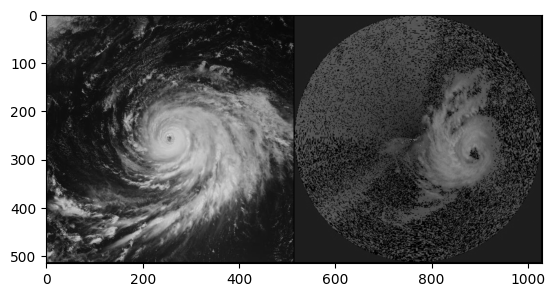

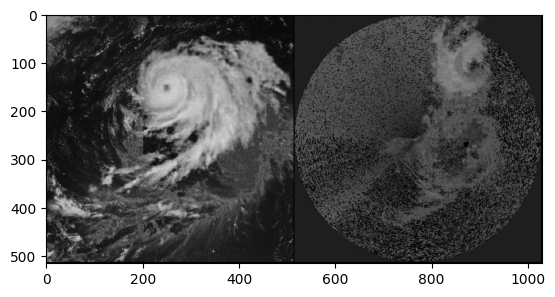

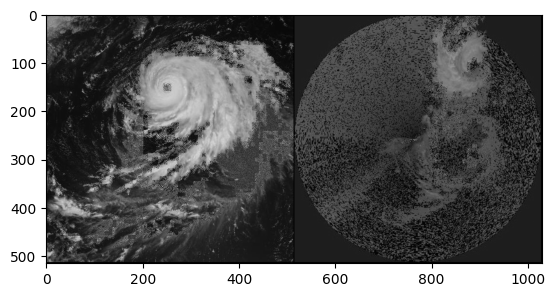

Training epoch 57


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 58


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 59


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 60


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 61


  0%|          | 0/10 [00:00<?, ?it/s]

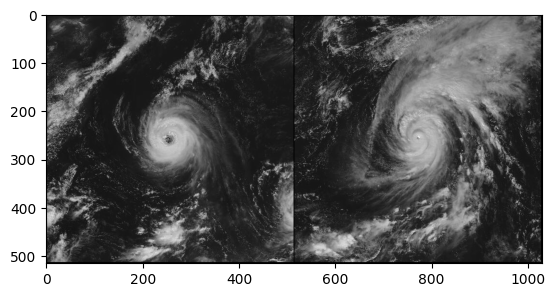

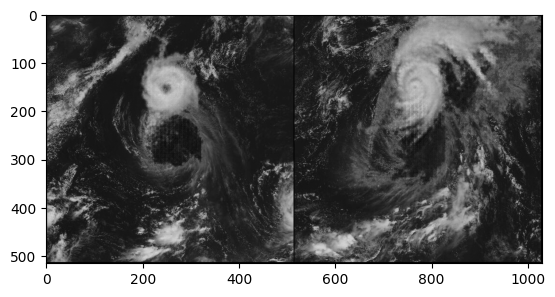

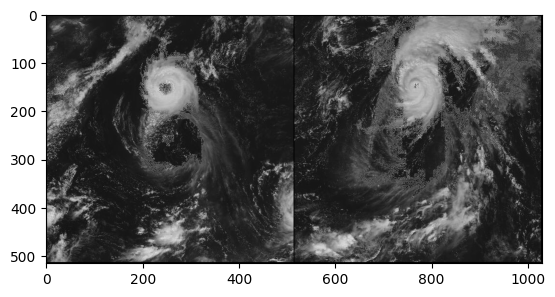

Training epoch 62


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 63


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 64


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 65


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 66


  0%|          | 0/10 [00:00<?, ?it/s]

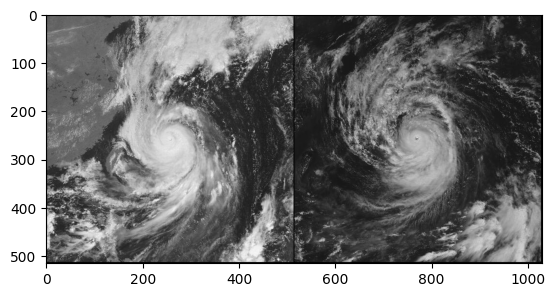

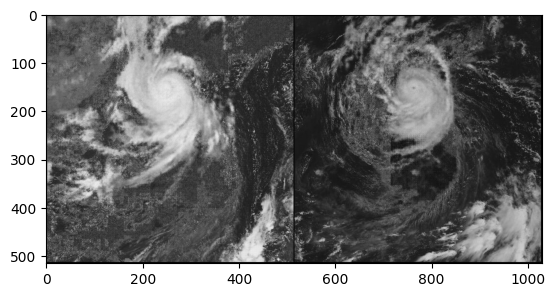

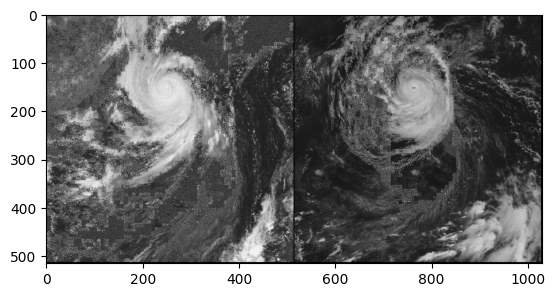

Training epoch 67


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 68


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 69


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 70


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 71


  0%|          | 0/10 [00:00<?, ?it/s]

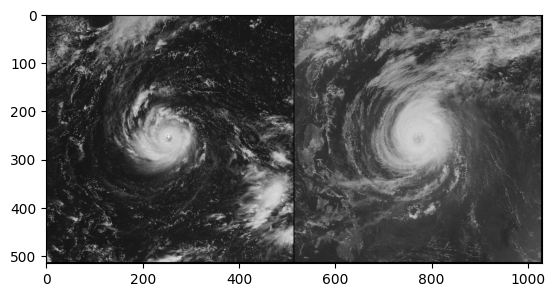

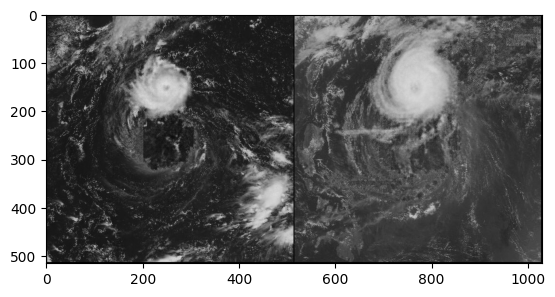

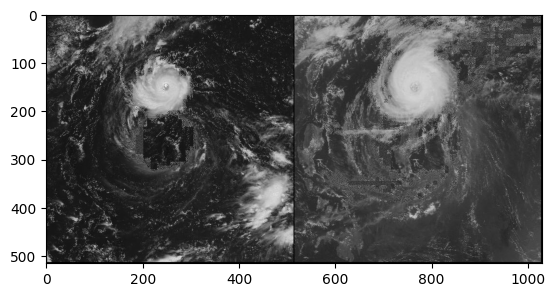

Training epoch 72


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 73


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 74


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 75


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 76


  0%|          | 0/10 [00:00<?, ?it/s]

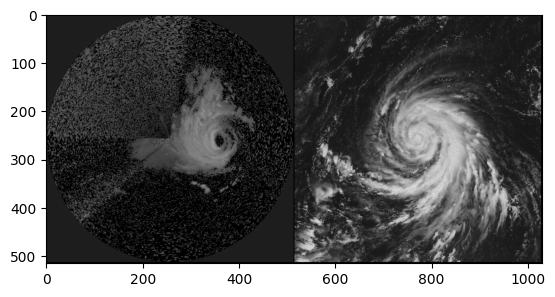

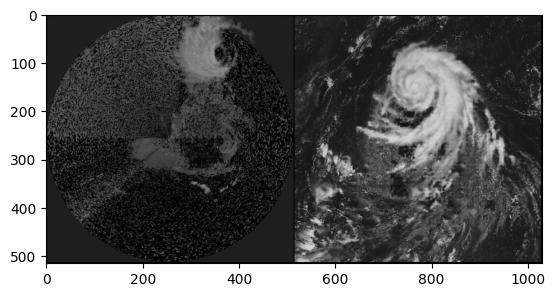

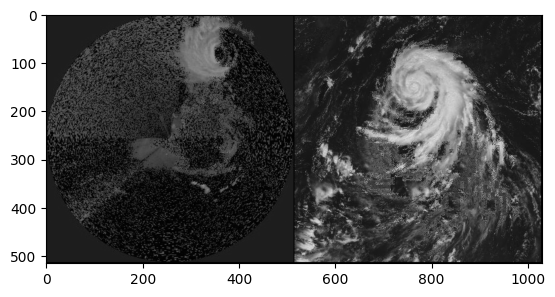

Training epoch 77


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 78


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 79


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 80


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 81


  0%|          | 0/10 [00:00<?, ?it/s]

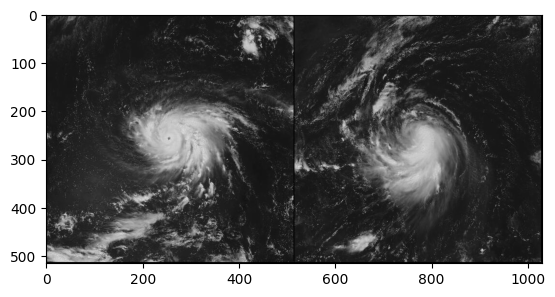

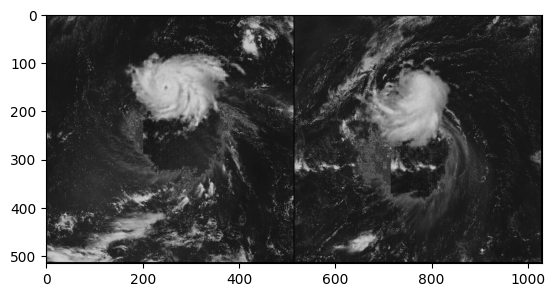

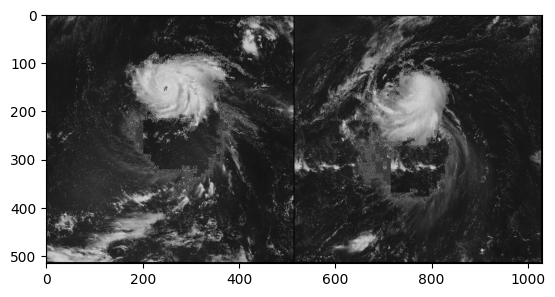

>Saved generator model: generator_epoch80.pth
Training epoch 82


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 83


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 84


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 85


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 86


  0%|          | 0/10 [00:00<?, ?it/s]

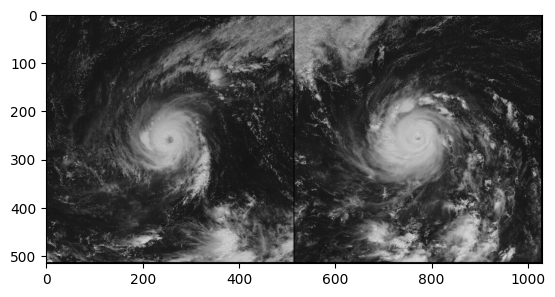

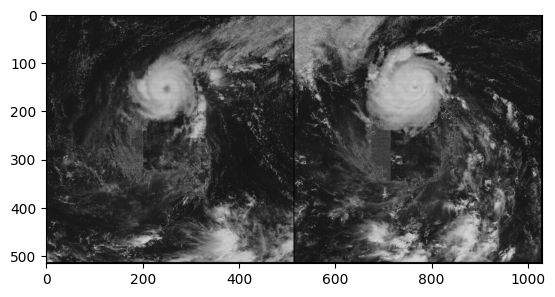

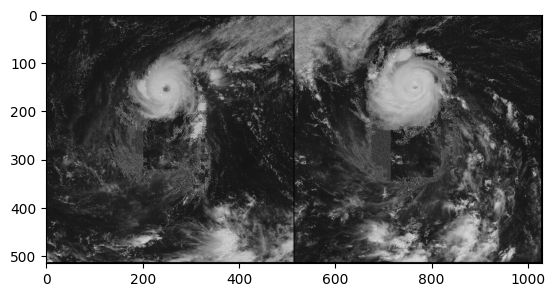

Training epoch 87


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 88


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 89


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 90


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 91


  0%|          | 0/10 [00:00<?, ?it/s]

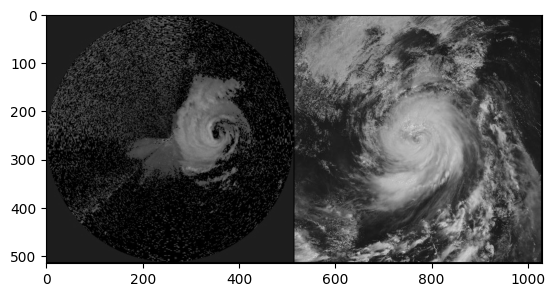

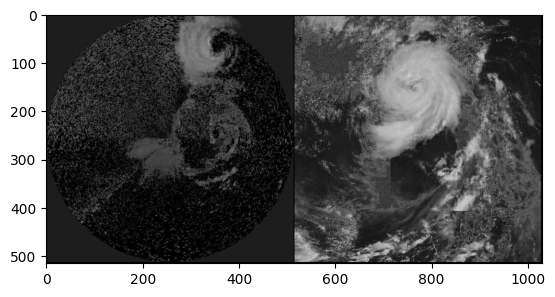

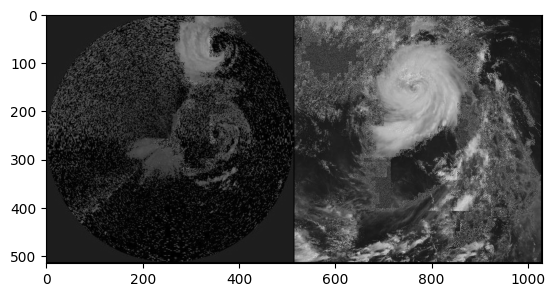

Training epoch 92


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 93


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 94


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 95


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 96


  0%|          | 0/10 [00:00<?, ?it/s]

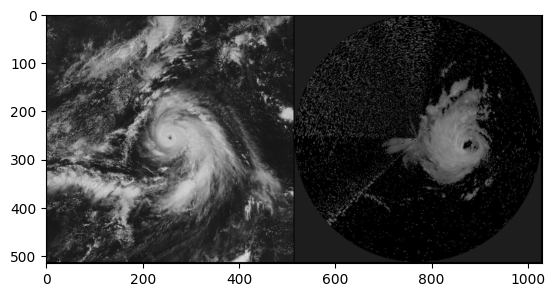

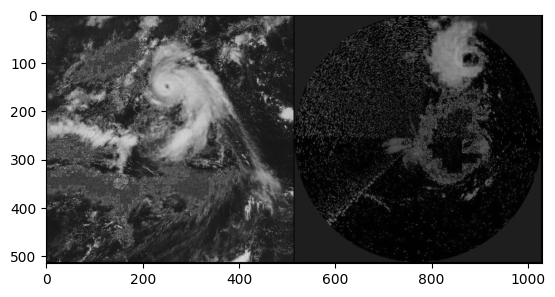

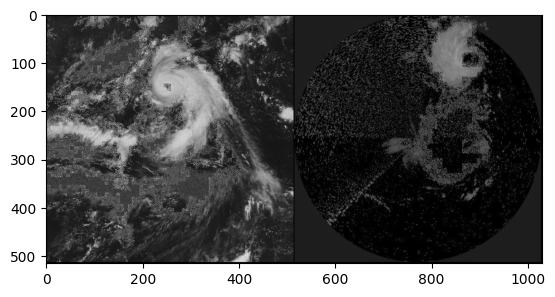

Training epoch 97


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 98


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 99


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 100


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 101


  0%|          | 0/10 [00:00<?, ?it/s]

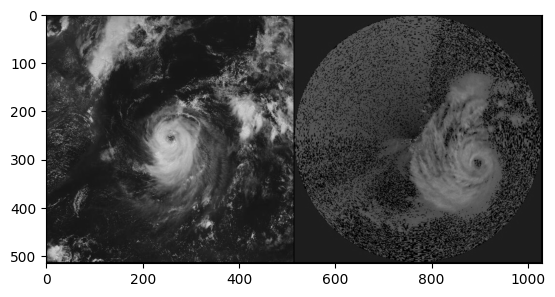

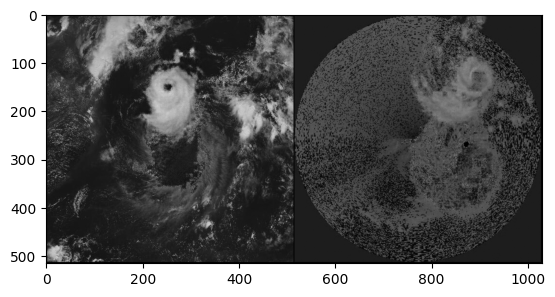

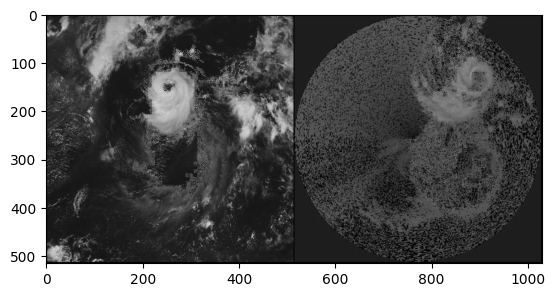

Training epoch 102


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 103


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 104


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 105


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 106


  0%|          | 0/10 [00:00<?, ?it/s]

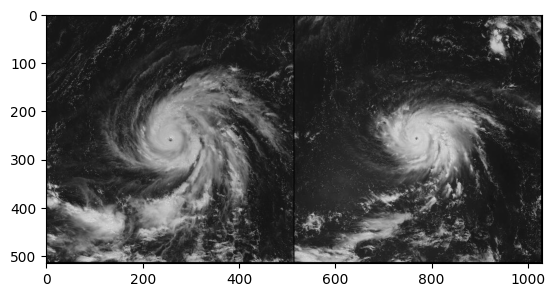

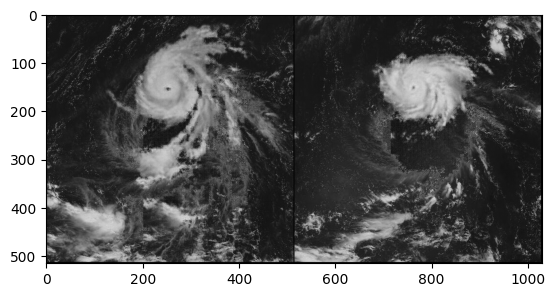

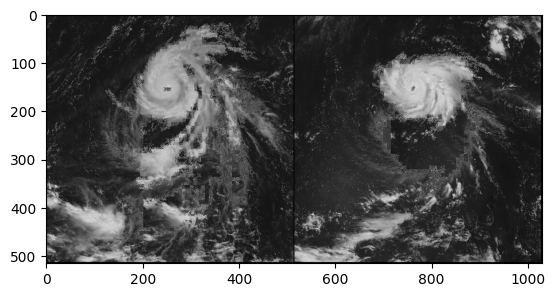

Training epoch 107


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 108


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 109


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 110


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 111


  0%|          | 0/10 [00:00<?, ?it/s]

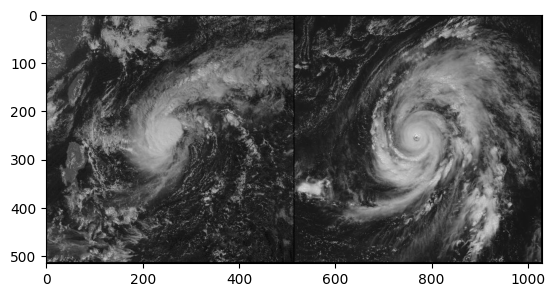

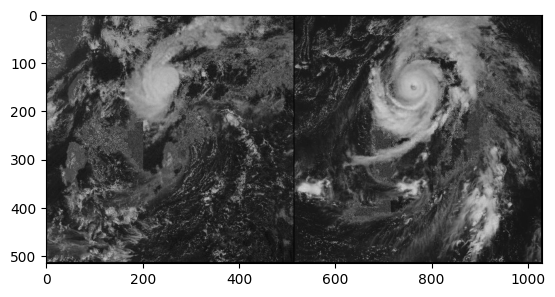

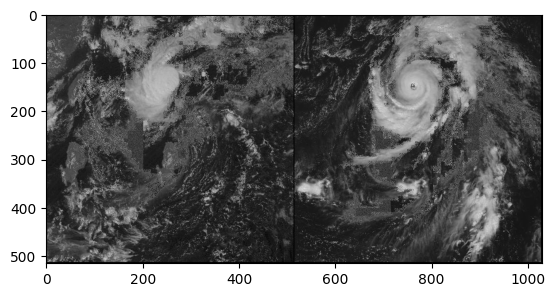

Training epoch 112


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 113


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 114


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 115


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 116


  0%|          | 0/10 [00:00<?, ?it/s]

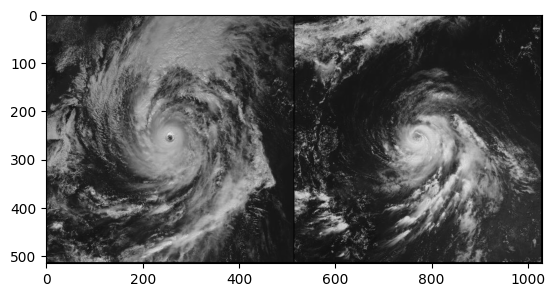

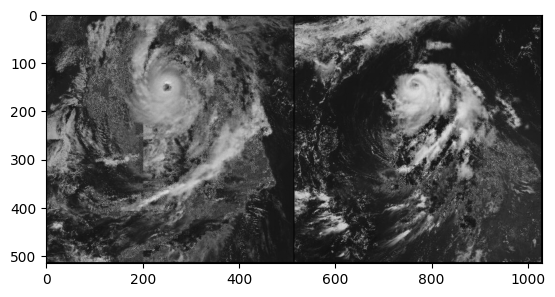

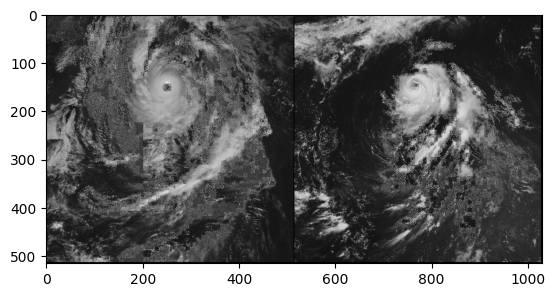

Training epoch 117


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 118


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 119


  0%|          | 0/10 [00:00<?, ?it/s]

Training epoch 120


  0%|          | 0/10 [00:00<?, ?it/s]

>Saved generator model: generator_epoch119.pth
Training epoch 121


  0%|          | 0/10 [00:00<?, ?it/s]

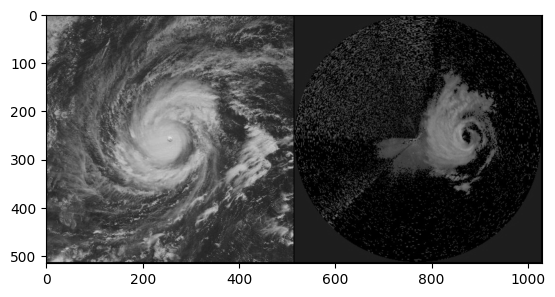

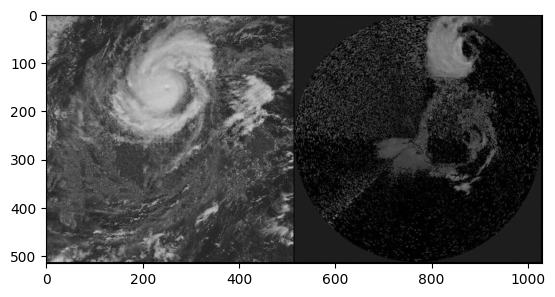

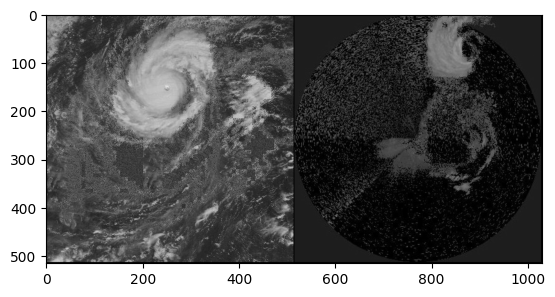

>Saved generator model: generator_epoch120.pth


In [ ]:
for epoch in range(NUM_EPOCHS+1):
    print(f"Training epoch {epoch+1}")
    for images in tqdm(dataloader_train):
       # Splitting the image

       inputs = images[:,:,:,:512].to(device)
       targets = images[:,:,:,512:].to(device)

       # Train Discriminator

       Disc_Loss = discriminator_training(inputs,targets,discriminator_opt)

       # Train Geneerator
       for i in range(2):
            Gen_Loss, generator_image = generator_training(inputs,targets, generator_opt, L1_lambda)

    if (epoch % 5) == 0:
         print_images(inputs,2)
         print_images(generator_image,2)
         print_images(targets,2)

    # Save model every 40 epochs
    if (epoch % 40 == 0) or (epoch == NUM_EPOCHS - 1):
        filename = f'generator_epoch{epoch}.pth'
        torch.save(generator.state_dict(), filename)
        print(f'>Saved generator model: {filename}')


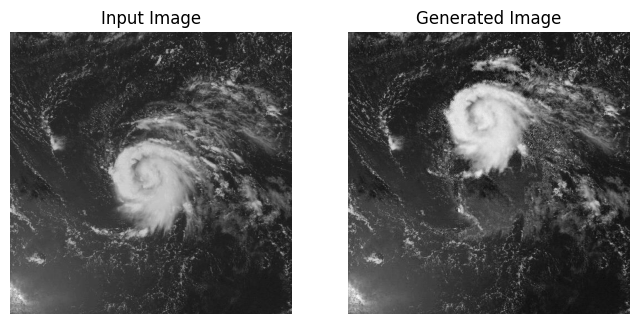

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from PIL import Image
# from models import Generator  # Make sure to replace with the correct import

# Instantiate the generator with the correct channels
generator = Generator(in_channels=1, out_channels=1)

# Load the trained generator model
generator.load_state_dict(torch.load('/content/drive/MyDrive/Cyclone images/CombinedDataset/Top/generator_epoch120.pth'))
generator.eval()

def preprocess_input_image(image_path):
    # Load image using PIL
    image = Image.open(image_path).convert("L")  # Convert to grayscale

    # Define transformations (resize and normalize)
    preprocess = transforms.Compose([
        transforms.Resize((512, 512)),  # Resize to the same size used during training
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize as done during training
    ])

    # Apply transformations
    input_image = preprocess(image)

    # Add batch dimension as the model expects a batch of images
    input_image = input_image.unsqueeze(0)

    return input_image

# Preprocess the input image
input_image_path = '/content/7.jpg'  # Replace with the path to your image
input_image = preprocess_input_image(input_image_path)


with torch.no_grad():
    output_image = generator(input_image)

# Display the input and output images
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(input_image.squeeze().cpu().numpy(), cmap='gray')
plt.title('Input Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(output_image.squeeze().cpu().numpy(), cmap='gray')
plt.title('Generated Image')
plt.axis('off')

plt.show()

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from PIL import Image
# from models import Generator  # Make sure to replace with the correct import

# Instantiate the generator with the correct channels
device = torch.device("cpu")
generator = Generator(in_channels=1, out_channels=1).to(device)

# Load the trained generator model
generator.load_state_dict(torch.load('/content/drive/MyDrive/generator_epoch80.pth', map_location=device))
generator.eval()

def preprocess_input_image(image_path, device):
    # Load image using PIL
    image = Image.open(image_path).convert("L")  # Convert to grayscale

    # Define transformations (resize and normalize)
    preprocess = transforms.Compose([
        transforms.Resize((512, 512)),  # Resize to the same size used during training
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize as done during training
    ])

    # Apply transformations
    input_image = preprocess(image).to(device)

    # Add batch dimension as the model expects a batch of images
    input_image = input_image.unsqueeze(0)

    return input_image

# Preprocess the input image
input_image_path = '/content/new.jpg'  # Replace with the path to your image
input_image = preprocess_input_image(input_image_path, device)


with torch.no_grad():
    output_image = generator(input_image)

# Display the input and output images
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(input_image.squeeze().cpu().numpy(), cmap='gray')
plt.title('Input Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(output_image.squeeze().cpu().numpy(), cmap='gray')
plt.title('Generated Image')
plt.axis('off')

plt.show()

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU, Activation
from tensorflow.keras.layers import BatchNormalization, Concatenate, Dropout
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model
from os import listdir
from numpy import asarray, load
from numpy import vstack
from numpy import savez_compressed
from matplotlib import pyplot
import numpy as np
from matplotlib import pyplot as plt
from numpy.random import randint
from numpy import zeros
import tensorflow as tf
from numpy import ones
from keras.layers import UpSampling2D


Loaded:  (150, 512, 512, 1) (150, 512, 512, 1)


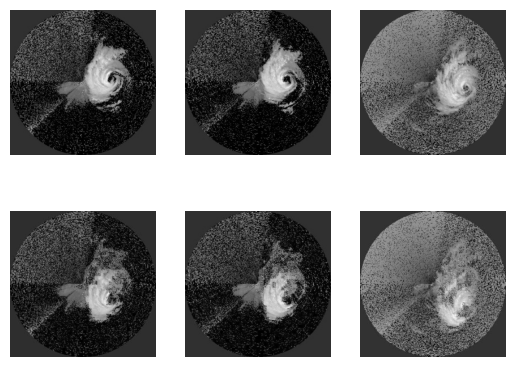

In [ ]:

from os import listdir
from numpy import asarray
import matplotlib.pyplot as plt

def load_images(path, size=(512, 1024)):
    src_list, tar_list = list(), list()
    for filename in listdir(path):
        # Load and resize the image
        pixels = load_img(path + filename, color_mode='grayscale', target_size=size)
        # Convert to numpy array
        pixels = img_to_array(pixels)
        # Split into satellite and map
        src_img, tar_img = pixels[:, :512], pixels[:, 512:]  # Divide the image into halves
        src_list.append(src_img)
        tar_list.append(tar_img)
    return [asarray(src_list), asarray(tar_list)]

# Dataset path
path = '/content/drive/MyDrive/Cyclone images/Bottom/combined_bottom/'
# Load dataset
[src_images, tar_images] = load_images(path)
print('Loaded: ', src_images.shape, tar_images.shape)

n_samples = 3
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.imshow(src_images[i].astype('uint8'), cmap='gray')

# Plot target image
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.imshow(tar_images[i].astype('uint8'), cmap='gray')
plt.show()


In [ ]:

# Encoder Block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
    init = RandomNormal(stddev=0.02)
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    g = LeakyReLU(alpha=0.2)(g)
    return g

# Decoder Block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    init = RandomNormal(stddev=0.02)
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    g = BatchNormalization()(g, training=True)
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    g = Activation('relu')(g)
    return g


def define_generator(image_shape=(512, 512, 1)):
    # weight initialization
    init = RandomNormal(stddev=0.02)

    # image input
    in_image = Input(shape=image_shape)

    # encoder model: C64-C128-C256-C512-C512-C512-C512-C512
    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e7 = define_encoder_block(e6, 512)

    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)

    # decoder model: CD512-CD512-CD512-C512-C256-C128-C64
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)

    # output
    g = Conv2DTranspose(1, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(g)

    # define model
    model = Model(in_image, out_image)
    return model

def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)

    # source image input
    in_src_image = Input(shape=image_shape)

    # target image input
    in_target_image = Input(shape=image_shape)

    # concatenate images, channel-wise
    merged = Concatenate()([in_src_image, in_target_image])

    # C64: 4x4 kernel Stride 2x2
    d = Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)

    # C128: 4x4 kernel Stride 2x2
    d = Conv2D(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)

    # C256: 4x4 kernel Stride 2x2
    d = Conv2D(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)

    # C512: 4x4 kernel Stride 2x2
    d = Conv2D(512, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)

    # second last output layer: 4x4 kernel but Stride 1x1 (Optional)
    d = Conv2D(512, (4, 4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)

    # patch output
    d = Conv2D(1, (4, 4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)

    # define model
    model = Model([in_src_image, in_target_image], patch_out)
    opt = Adam(learning_rate=0.0002, beta_1=0.5)

    # compile model
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    return model

# Define the combined GAN architecture
def define_gan(g_model, d_model, image_shape):
    for layer in d_model.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = False

    in_src = Input(shape=image_shape)
    gen_out = g_model(in_src)
    dis_out = d_model([in_src, gen_out])
    model = Model(in_src, [dis_out, gen_out])
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)

    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])

    return model

def generate_real_samples(dataset, n_samples, patch_shape):
    trainA, trainB = dataset
    ix = randint(0, trainA.shape[0], n_samples)
    X1, X2 = trainA[ix], trainB[ix]
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

def generate_fake_samples(g_model, samples, patch_shape):
    X = g_model.predict(samples)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

# Save the generator model and check how good the generated image looks.
def summarize_performance(step, g_model, dataset, n_samples=3):
    [X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
    X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)

    # Scale all pixels from [-1,1] to [0,1]
    X_realA = (X_realA + 1) / 2.0
    X_realB = (X_realB + 1) / 2.0
    X_fakeB = (X_fakeB + 1) / 2.0

    # Plot real source images
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + i)
        plt.axis('off')
        plt.imshow(X_realA[i][:,:,0], cmap='gray')  # Displaying only one channel for grayscale images

    # Plot generated target image
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.imshow(X_fakeB[i][:,:,0], cmap='gray')  # Displaying only one channel for grayscale images

    # Plot real target image
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples*2 + i)
        plt.axis('off')
        plt.imshow(X_realB[i][:,:,0], cmap='gray')  # Displaying only one channel for grayscale images

    # Save plot to file
    filename1 = 'plot_%06d.png' % (step+1)
    plt.savefig(filename1)
    plt.close()

    # Save the generator model
    filename2 = 'model_%06d.h5' % (step+1)
    g_model.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

# Train function for the pix2pix model
def train(d_model, g_model, gan_model, dataset, n_epochs, n_batch):
    n_patch = d_model.output_shape[1]
    trainA, trainB = dataset
    bat_per_epo = int(len(trainA) / n_batch)
    n_steps = bat_per_epo * n_epochs

    for i in range(n_steps):
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)

        d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
        d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])

        # Summarize model performance
        print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
        if (i+1) % (bat_per_epo * 10) == 0:
            summarize_performance(i, g_model, dataset)

# Preprocess the data
def preprocess_data(data):
    X1, X2 = data[0], data[1]
    # Scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]


In [ ]:

# Load the data
data = [src_images, tar_images]

# Preprocess the data
dataset = preprocess_data(data)

# Define the image shape
image_shape = src_images.shape[1:]

# Define the discriminator model
d_model = define_discriminator(image_shape)

# Define the generator model
g_model = define_generator(image_shape)

# Define the GAN model
gan_model = define_gan(g_model, d_model, image_shape)


train(d_model, g_model, gan_model, dataset, n_epochs=200, n_batch=10)




1/1 [==============================] - 0s 443ms/step
>1, d1[0.609] d2[0.735] g[63.504]
1/1 [==============================] - 0s 28ms/step
>2, d1[0.657] d2[0.633] g[49.724]
1/1 [==============================] - 0s 23ms/step
>3, d1[0.584] d2[0.551] g[37.701]
1/1 [==============================] - 0s 25ms/step
>4, d1[0.353] d2[0.573] g[32.948]
1/1 [==============================] - 0s 26ms/step
>5, d1[0.421] d2[0.412] g[23.871]
1/1 [==============================] - 0s 24ms/step
>6, d1[0.350] d2[0.384] g[20.039]
1/1 [==============================] - 0s 32ms/step
>7, d1[0.356] d2[0.347] g[20.711]
1/1 [==============================] - 0s 29ms/step
>8, d1[0.314] d2[0.460] g[19.022]
1/1 [==============================] - 0s 29ms/step
>9, d1[0.334] d2[0.387] g[15.841]
1/1 [==============================] - 0s 27ms/step
>10, d1[0.360] d2[0.365] g[18.172]
1/1 [==============================] - 0s 26ms/step
>11, d1[0.373] d2[0.406] g[16.326]
1/1 [==============================] - 0s 25ms/step

>Saved generator model: model_generator_150.h5
>Saved discriminator model: model_discriminator_150.h5
1/1 [==============================] - 0s 37ms/step
>151, d1[0.381] d2[0.367] g[9.438]
1/1 [==============================] - 0s 39ms/step
>152, d1[0.326] d2[0.383] g[10.415]
1/1 [==============================] - 0s 25ms/step
>153, d1[0.327] d2[0.396] g[8.987]
1/1 [==============================] - 0s 25ms/step
>154, d1[0.333] d2[0.360] g[9.175]
1/1 [==============================] - 0s 27ms/step
>155, d1[0.340] d2[0.345] g[9.290]
1/1 [==============================] - 0s 25ms/step
>156, d1[0.372] d2[0.315] g[11.396]
1/1 [==============================] - 0s 26ms/step
>157, d1[0.289] d2[0.446] g[10.129]
1/1 [==============================] - 0s 37ms/step
>158, d1[0.300] d2[0.358] g[8.658]
1/1 [==============================] - 0s 24ms/step
>159, d1[0.364] d2[0.368] g[8.389]
1/1 [==============================] - 0s 25ms/step
>160, d1[0.343] d2[0.315] g[17.860]
1/1 [===================

>Saved generator model: model_generator_300.h5
>Saved discriminator model: model_discriminator_300.h5
1/1 [==============================] - 0s 39ms/step
>301, d1[0.304] d2[0.267] g[9.918]
1/1 [==============================] - 0s 25ms/step
>302, d1[0.349] d2[0.368] g[12.345]
1/1 [==============================] - 0s 26ms/step
>303, d1[0.259] d2[0.310] g[9.489]
1/1 [==============================] - 0s 26ms/step
>304, d1[0.282] d2[0.302] g[8.174]
1/1 [==============================] - 0s 25ms/step
>305, d1[0.311] d2[0.277] g[9.055]
1/1 [==============================] - 0s 24ms/step
>306, d1[0.242] d2[0.284] g[9.360]
1/1 [==============================] - 0s 25ms/step
>307, d1[0.194] d2[0.298] g[9.382]
1/1 [==============================] - 0s 33ms/step
>308, d1[0.223] d2[0.289] g[8.181]
1/1 [==============================] - 0s 25ms/step
>309, d1[0.211] d2[0.352] g[10.124]
1/1 [==============================] - 0s 29ms/step
>310, d1[0.338] d2[0.332] g[8.566]
1/1 [=====================

>Saved generator model: model_generator_450.h5
>Saved discriminator model: model_discriminator_450.h5
1/1 [==============================] - 0s 37ms/step
>451, d1[0.125] d2[0.173] g[9.018]
1/1 [==============================] - 0s 24ms/step
>452, d1[0.103] d2[0.144] g[10.062]
1/1 [==============================] - 0s 24ms/step
>453, d1[0.082] d2[0.244] g[9.755]
1/1 [==============================] - 0s 26ms/step
>454, d1[0.122] d2[0.193] g[9.662]
1/1 [==============================] - 0s 25ms/step
>455, d1[0.165] d2[0.343] g[10.240]
1/1 [==============================] - 0s 26ms/step
>456, d1[0.177] d2[0.150] g[9.969]
1/1 [==============================] - 0s 26ms/step
>457, d1[0.154] d2[0.216] g[10.190]
1/1 [==============================] - 0s 36ms/step
>458, d1[0.116] d2[0.245] g[11.047]
1/1 [==============================] - 0s 24ms/step
>459, d1[0.165] d2[0.158] g[8.368]
1/1 [==============================] - 0s 24ms/step
>460, d1[0.142] d2[0.253] g[11.473]
1/1 [==================

>Saved generator model: model_generator_600.h5
>Saved discriminator model: model_discriminator_600.h5
1/1 [==============================] - 0s 39ms/step
>601, d1[0.342] d2[0.602] g[7.796]
1/1 [==============================] - 0s 25ms/step
>602, d1[0.296] d2[0.487] g[6.956]
1/1 [==============================] - 0s 25ms/step
>603, d1[0.321] d2[0.431] g[8.556]
1/1 [==============================] - 0s 42ms/step
>604, d1[0.340] d2[0.406] g[6.965]
1/1 [==============================] - 0s 26ms/step
>605, d1[0.350] d2[0.405] g[7.114]
1/1 [==============================] - 0s 25ms/step
>606, d1[0.361] d2[0.385] g[9.280]
1/1 [==============================] - 0s 27ms/step
>607, d1[0.356] d2[0.386] g[8.100]
1/1 [==============================] - 0s 24ms/step
>608, d1[0.339] d2[0.401] g[6.972]
1/1 [==============================] - 0s 27ms/step
>609, d1[0.347] d2[0.388] g[7.036]
1/1 [==============================] - 0s 27ms/step
>610, d1[0.352] d2[0.371] g[9.030]
1/1 [=======================

>Saved generator model: model_generator_750.h5
>Saved discriminator model: model_discriminator_750.h5
1/1 [==============================] - 0s 27ms/step
>751, d1[0.075] d2[0.154] g[8.112]
1/1 [==============================] - 0s 35ms/step
>752, d1[0.074] d2[0.122] g[7.171]
1/1 [==============================] - 0s 26ms/step
>753, d1[0.078] d2[0.115] g[9.054]
1/1 [==============================] - 0s 26ms/step
>754, d1[0.079] d2[0.144] g[7.193]
1/1 [==============================] - 0s 24ms/step
>755, d1[0.108] d2[0.140] g[7.316]
1/1 [==============================] - 0s 25ms/step
>756, d1[0.073] d2[0.377] g[6.703]
1/1 [==============================] - 0s 24ms/step
>757, d1[0.465] d2[0.573] g[6.374]
1/1 [==============================] - 0s 24ms/step
>758, d1[0.271] d2[0.483] g[6.764]
1/1 [==============================] - 0s 33ms/step
>759, d1[0.281] d2[0.433] g[5.903]
1/1 [==============================] - 0s 25ms/step
>760, d1[0.308] d2[0.379] g[8.223]
1/1 [=======================

>Saved generator model: model_generator_900.h5
>Saved discriminator model: model_discriminator_900.h5
1/1 [==============================] - 0s 25ms/step
>901, d1[0.082] d2[0.135] g[7.911]
1/1 [==============================] - 0s 25ms/step
>902, d1[0.079] d2[0.123] g[7.356]
1/1 [==============================] - 0s 28ms/step
>903, d1[0.078] d2[0.119] g[7.097]
1/1 [==============================] - 0s 25ms/step
>904, d1[0.076] d2[0.117] g[6.984]
1/1 [==============================] - 0s 24ms/step
>905, d1[0.072] d2[0.118] g[9.778]
1/1 [==============================] - 0s 25ms/step
>906, d1[0.076] d2[0.118] g[7.363]
1/1 [==============================] - 0s 26ms/step
>907, d1[0.088] d2[0.165] g[7.506]
1/1 [==============================] - 0s 38ms/step
>908, d1[0.085] d2[0.143] g[6.968]
1/1 [==============================] - 0s 38ms/step
>909, d1[0.081] d2[0.141] g[7.961]
1/1 [==============================] - 0s 25ms/step
>910, d1[0.086] d2[0.130] g[7.115]
1/1 [=======================

>Saved generator model: model_generator_1050.h5
>Saved discriminator model: model_discriminator_1050.h5
1/1 [==============================] - 0s 39ms/step
>1051, d1[0.063] d2[0.114] g[8.247]
1/1 [==============================] - 0s 38ms/step
>1052, d1[0.067] d2[0.116] g[7.824]
1/1 [==============================] - 0s 28ms/step
>1053, d1[0.079] d2[0.124] g[6.038]
1/1 [==============================] - 0s 24ms/step
>1054, d1[0.062] d2[0.232] g[6.802]
1/1 [==============================] - 0s 26ms/step
>1055, d1[0.244] d2[0.343] g[9.230]
1/1 [==============================] - 0s 25ms/step
>1056, d1[0.129] d2[0.238] g[7.865]
1/1 [==============================] - 0s 39ms/step
>1057, d1[0.208] d2[0.147] g[7.501]
1/1 [==============================] - 0s 24ms/step
>1058, d1[0.101] d2[0.139] g[8.217]
1/1 [==============================] - 0s 25ms/step
>1059, d1[0.082] d2[0.143] g[8.627]
1/1 [==============================] - 0s 24ms/step
>1060, d1[0.074] d2[0.132] g[7.888]
1/1 [===========

>Saved generator model: model_generator_1200.h5
>Saved discriminator model: model_discriminator_1200.h5
1/1 [==============================] - 0s 57ms/step
>1201, d1[0.337] d2[0.384] g[6.220]
1/1 [==============================] - 0s 26ms/step
>1202, d1[0.326] d2[0.397] g[6.045]
1/1 [==============================] - 0s 27ms/step
>1203, d1[0.329] d2[0.386] g[6.180]
1/1 [==============================] - 0s 24ms/step
>1204, d1[0.329] d2[0.385] g[6.918]
1/1 [==============================] - 0s 25ms/step
>1205, d1[0.348] d2[0.373] g[5.731]
1/1 [==============================] - 0s 26ms/step
>1206, d1[0.334] d2[0.380] g[9.493]
1/1 [==============================] - 0s 25ms/step
>1207, d1[0.319] d2[0.392] g[8.947]
1/1 [==============================] - 0s 25ms/step
>1208, d1[0.344] d2[0.386] g[6.837]
1/1 [==============================] - 0s 34ms/step
>1209, d1[0.328] d2[0.387] g[6.144]
1/1 [==============================] - 0s 25ms/step
>1210, d1[0.316] d2[0.363] g[6.619]
1/1 [===========

>Saved generator model: model_generator_1350.h5
>Saved discriminator model: model_discriminator_1350.h5
1/1 [==============================] - 0s 27ms/step
>1351, d1[0.157] d2[0.243] g[7.853]
1/1 [==============================] - 0s 25ms/step
>1352, d1[0.237] d2[0.209] g[7.159]
1/1 [==============================] - 0s 32ms/step
>1353, d1[0.097] d2[0.258] g[7.402]
1/1 [==============================] - 0s 25ms/step
>1354, d1[0.265] d2[0.438] g[8.815]
1/1 [==============================] - 0s 24ms/step
>1355, d1[0.320] d2[0.183] g[7.431]
1/1 [==============================] - 0s 24ms/step
>1356, d1[0.132] d2[0.259] g[7.569]
1/1 [==============================] - 0s 24ms/step
>1357, d1[0.265] d2[0.178] g[7.283]
1/1 [==============================] - 0s 24ms/step
>1358, d1[0.142] d2[0.157] g[8.367]
1/1 [==============================] - 0s 25ms/step
>1359, d1[0.080] d2[0.110] g[7.128]
1/1 [==============================] - 0s 24ms/step
>1360, d1[0.080] d2[0.112] g[6.657]
1/1 [===========

>Saved generator model: model_generator_1500.h5
>Saved discriminator model: model_discriminator_1500.h5
1/1 [==============================] - 0s 47ms/step
>1501, d1[0.071] d2[0.123] g[7.699]
1/1 [==============================] - 0s 27ms/step
>1502, d1[0.086] d2[0.103] g[7.258]
1/1 [==============================] - 0s 28ms/step
>1503, d1[0.058] d2[0.098] g[6.614]
1/1 [==============================] - 0s 26ms/step
>1504, d1[0.051] d2[0.099] g[7.043]
1/1 [==============================] - 0s 26ms/step
>1505, d1[0.050] d2[0.096] g[8.185]
1/1 [==============================] - 0s 41ms/step
>1506, d1[0.057] d2[0.096] g[6.602]
1/1 [==============================] - 0s 28ms/step
>1507, d1[0.051] d2[0.102] g[8.559]
1/1 [==============================] - 0s 28ms/step
>1508, d1[0.058] d2[0.101] g[7.119]
1/1 [==============================] - 0s 27ms/step
>1509, d1[0.048] d2[0.100] g[7.831]
1/1 [==============================] - 0s 26ms/step
>1510, d1[0.058] d2[0.101] g[6.395]
1/1 [===========

>Saved generator model: model_generator_1650.h5
>Saved discriminator model: model_discriminator_1650.h5
1/1 [==============================] - 0s 28ms/step
>1651, d1[0.059] d2[0.104] g[6.468]
1/1 [==============================] - 0s 25ms/step
>1652, d1[0.055] d2[0.106] g[6.541]
1/1 [==============================] - 0s 25ms/step
>1653, d1[0.054] d2[0.102] g[6.545]
1/1 [==============================] - 0s 27ms/step
>1654, d1[0.057] d2[0.112] g[10.054]
1/1 [==============================] - 0s 35ms/step
>1655, d1[0.064] d2[0.115] g[7.105]
1/1 [==============================] - 0s 25ms/step
>1656, d1[0.061] d2[0.109] g[7.546]
1/1 [==============================] - 0s 26ms/step
>1657, d1[0.053] d2[0.108] g[8.809]
1/1 [==============================] - 0s 24ms/step
>1658, d1[0.056] d2[0.104] g[7.342]
1/1 [==============================] - 0s 24ms/step
>1659, d1[0.053] d2[0.108] g[7.977]
1/1 [==============================] - 0s 25ms/step
>1660, d1[0.055] d2[0.111] g[6.770]
1/1 [==========

>Saved generator model: model_generator_1800.h5
>Saved discriminator model: model_discriminator_1800.h5
1/1 [==============================] - 0s 30ms/step
>1801, d1[0.095] d2[0.157] g[6.280]
1/1 [==============================] - 0s 27ms/step
>1802, d1[0.101] d2[0.160] g[5.551]
1/1 [==============================] - 0s 25ms/step
>1803, d1[0.099] d2[0.155] g[6.538]
1/1 [==============================] - 0s 25ms/step
>1804, d1[0.096] d2[0.157] g[6.389]
1/1 [==============================] - 0s 25ms/step
>1805, d1[0.096] d2[0.162] g[5.671]
1/1 [==============================] - 0s 25ms/step
>1806, d1[0.098] d2[0.168] g[6.362]
1/1 [==============================] - 0s 32ms/step
>1807, d1[0.112] d2[0.193] g[6.351]
1/1 [==============================] - 0s 25ms/step
>1808, d1[0.121] d2[0.168] g[6.676]
1/1 [==============================] - 0s 26ms/step
>1809, d1[0.116] d2[0.154] g[7.610]
1/1 [==============================] - 0s 24ms/step
>1810, d1[0.118] d2[0.155] g[5.794]
1/1 [===========

>Saved generator model: model_generator_1950.h5
>Saved discriminator model: model_discriminator_1950.h5
1/1 [==============================] - 0s 28ms/step
>1951, d1[0.147] d2[0.204] g[5.894]
1/1 [==============================] - 0s 25ms/step
>1952, d1[0.146] d2[0.204] g[6.424]
1/1 [==============================] - 0s 25ms/step
>1953, d1[0.143] d2[0.202] g[6.603]
1/1 [==============================] - 0s 25ms/step
>1954, d1[0.146] d2[0.206] g[5.943]
1/1 [==============================] - 0s 26ms/step
>1955, d1[0.146] d2[0.206] g[7.782]
1/1 [==============================] - 0s 34ms/step
>1956, d1[0.151] d2[0.209] g[6.402]
1/1 [==============================] - 0s 25ms/step
>1957, d1[0.148] d2[0.207] g[6.361]
1/1 [==============================] - 0s 25ms/step
>1958, d1[0.150] d2[0.207] g[5.418]
1/1 [==============================] - 0s 24ms/step
>1959, d1[0.147] d2[0.208] g[7.374]
1/1 [==============================] - 0s 25ms/step
>1960, d1[0.153] d2[0.210] g[6.190]
1/1 [===========

>Saved generator model: model_generator_2100.h5
>Saved discriminator model: model_discriminator_2100.h5
1/1 [==============================] - 0s 24ms/step
>2101, d1[0.196] d2[0.267] g[5.997]
1/1 [==============================] - 0s 24ms/step
>2102, d1[0.195] d2[0.265] g[5.653]
1/1 [==============================] - 0s 24ms/step
>2103, d1[0.194] d2[0.265] g[5.902]
1/1 [==============================] - 0s 24ms/step
>2104, d1[0.195] d2[0.264] g[5.356]
1/1 [==============================] - 0s 24ms/step
>2105, d1[0.194] d2[0.264] g[5.738]
1/1 [==============================] - 0s 24ms/step
>2106, d1[0.195] d2[0.266] g[5.386]
1/1 [==============================] - 0s 38ms/step
>2107, d1[0.194] d2[0.269] g[7.345]
1/1 [==============================] - 0s 24ms/step
>2108, d1[0.200] d2[0.270] g[6.823]
1/1 [==============================] - 0s 23ms/step
>2109, d1[0.199] d2[0.269] g[6.237]
1/1 [==============================] - 0s 29ms/step
>2110, d1[0.203] d2[0.272] g[5.613]
1/1 [===========

>Saved generator model: model_generator_2250.h5
>Saved discriminator model: model_discriminator_2250.h5
1/1 [==============================] - 0s 25ms/step
>2251, d1[0.217] d2[0.297] g[4.734]
1/1 [==============================] - 0s 24ms/step
>2252, d1[0.209] d2[0.299] g[8.389]
1/1 [==============================] - 0s 24ms/step
>2253, d1[0.207] d2[0.300] g[6.180]
1/1 [==============================] - 0s 24ms/step
>2254, d1[0.208] d2[0.299] g[5.915]
1/1 [==============================] - 0s 24ms/step
>2255, d1[0.211] d2[0.297] g[5.631]
1/1 [==============================] - 0s 33ms/step
>2256, d1[0.210] d2[0.296] g[6.036]
1/1 [==============================] - 0s 25ms/step
>2257, d1[0.208] d2[0.297] g[6.770]
1/1 [==============================] - 0s 23ms/step
>2258, d1[0.210] d2[0.295] g[5.111]
1/1 [==============================] - 0s 24ms/step
>2259, d1[0.209] d2[0.295] g[5.247]
1/1 [==============================] - 0s 24ms/step
>2260, d1[0.206] d2[0.297] g[5.740]
1/1 [===========

>Saved generator model: model_generator_2400.h5
>Saved discriminator model: model_discriminator_2400.h5
1/1 [==============================] - 0s 26ms/step
>2401, d1[0.231] d2[0.314] g[6.297]
1/1 [==============================] - 0s 25ms/step
>2402, d1[0.236] d2[0.315] g[4.967]
1/1 [==============================] - 0s 26ms/step
>2403, d1[0.232] d2[0.315] g[6.095]
1/1 [==============================] - 0s 29ms/step
>2404, d1[0.235] d2[0.315] g[5.446]
1/1 [==============================] - 0s 25ms/step
>2405, d1[0.236] d2[0.315] g[5.441]
1/1 [==============================] - 0s 35ms/step
>2406, d1[0.236] d2[0.315] g[5.381]
1/1 [==============================] - 0s 25ms/step
>2407, d1[0.234] d2[0.316] g[5.891]
1/1 [==============================] - 0s 25ms/step
>2408, d1[0.235] d2[0.316] g[5.420]
1/1 [==============================] - 0s 25ms/step
>2409, d1[0.234] d2[0.316] g[6.383]
1/1 [==============================] - 0s 27ms/step
>2410, d1[0.236] d2[0.316] g[5.084]
1/1 [===========

>Saved generator model: model_generator_2550.h5
>Saved discriminator model: model_discriminator_2550.h5
1/1 [==============================] - 0s 28ms/step
>2551, d1[0.224] d2[0.333] g[5.816]
1/1 [==============================] - 0s 24ms/step
>2552, d1[0.222] d2[0.332] g[5.543]
1/1 [==============================] - 0s 24ms/step
>2553, d1[0.223] d2[0.332] g[5.360]
1/1 [==============================] - 0s 27ms/step
>2554, d1[0.223] d2[0.332] g[6.239]
1/1 [==============================] - 0s 24ms/step
>2555, d1[0.224] d2[0.331] g[4.630]
1/1 [==============================] - 0s 29ms/step
>2556, d1[0.224] d2[0.331] g[5.050]
1/1 [==============================] - 0s 32ms/step
>2557, d1[0.226] d2[0.330] g[4.520]
1/1 [==============================] - 0s 26ms/step
>2558, d1[0.226] d2[0.331] g[6.098]
1/1 [==============================] - 0s 24ms/step
>2559, d1[0.227] d2[0.332] g[5.691]
1/1 [==============================] - 0s 26ms/step
>2560, d1[0.227] d2[0.333] g[6.219]
1/1 [===========

>Saved generator model: model_generator_2700.h5
>Saved discriminator model: model_discriminator_2700.h5
1/1 [==============================] - 0s 24ms/step
>2701, d1[0.245] d2[0.353] g[4.843]
1/1 [==============================] - 0s 25ms/step
>2702, d1[0.244] d2[0.352] g[5.795]
1/1 [==============================] - 0s 25ms/step
>2703, d1[0.244] d2[0.352] g[5.422]
1/1 [==============================] - 0s 26ms/step
>2704, d1[0.244] d2[0.351] g[4.647]
1/1 [==============================] - 0s 24ms/step
>2705, d1[0.244] d2[0.352] g[5.732]
1/1 [==============================] - 0s 34ms/step
>2706, d1[0.244] d2[0.352] g[4.923]
1/1 [==============================] - 0s 25ms/step
>2707, d1[0.244] d2[0.352] g[4.979]
1/1 [==============================] - 0s 24ms/step
>2708, d1[0.244] d2[0.350] g[5.091]
1/1 [==============================] - 0s 24ms/step
>2709, d1[0.246] d2[0.349] g[4.671]
1/1 [==============================] - 0s 25ms/step
>2710, d1[0.245] d2[0.349] g[4.489]
1/1 [===========

>Saved generator model: model_generator_2850.h5
>Saved discriminator model: model_discriminator_2850.h5
1/1 [==============================] - 0s 33ms/step
>2851, d1[0.235] d2[0.343] g[5.432]
1/1 [==============================] - 0s 24ms/step
>2852, d1[0.234] d2[0.343] g[5.375]
1/1 [==============================] - 0s 24ms/step
>2853, d1[0.235] d2[0.341] g[4.965]
1/1 [==============================] - 0s 27ms/step
>2854, d1[0.235] d2[0.341] g[5.336]
1/1 [==============================] - 0s 24ms/step
>2855, d1[0.235] d2[0.341] g[5.148]
1/1 [==============================] - 0s 24ms/step
>2856, d1[0.233] d2[0.342] g[6.146]
1/1 [==============================] - 0s 24ms/step
>2857, d1[0.234] d2[0.342] g[5.734]
1/1 [==============================] - 0s 32ms/step
>2858, d1[0.235] d2[0.341] g[5.289]
1/1 [==============================] - 0s 26ms/step
>2859, d1[0.236] d2[0.341] g[5.582]
1/1 [==============================] - 0s 24ms/step
>2860, d1[0.235] d2[0.343] g[5.039]
1/1 [===========

>Saved generator model: model_generator_3000.h5
>Saved discriminator model: model_discriminator_3000.h5


In [ ]:
import os
import shutil

def move_files_by_prefix(src_folder, dst_folder, prefix):
    # Create destination folder if it doesn't exist
    if not os.path.exists(dst_folder):
        os.makedirs(dst_folder)

    # Iterate through files in the source folder
    for filename in os.listdir(src_folder):
        src_path = os.path.join(src_folder, filename)

        # Check if the file starts with the specified prefix
        if filename.startswith(prefix):
            dst_path = os.path.join(dst_folder, filename)

            # Move the file to the destination folder
            shutil.move(src_path, dst_path)
            print(f"File {filename} moved to {dst_folder}")

# Replace these paths with your actual source and destination folder paths
source_folder = '/content/'
destination_folder = '/content/model/'

# Specify the prefix
prefix = 'plot_'

move_files_by_prefix(source_folder, destination_folder, prefix)


File plot_001500.png moved to /content/model/
File plot_000900.png moved to /content/model/
File plot_002550.png moved to /content/model/
File plot_002400.png moved to /content/model/
File plot_005850.png moved to /content/model/
File plot_002250.png moved to /content/model/
File plot_006000.png moved to /content/model/
File plot_001950.png moved to /content/model/
File plot_004050.png moved to /content/model/
File plot_000150.png moved to /content/model/
File plot_005250.png moved to /content/model/
File plot_003300.png moved to /content/model/
File plot_002100.png moved to /content/model/
File plot_001800.png moved to /content/model/
File plot_001350.png moved to /content/model/
File plot_004950.png moved to /content/model/
File plot_003900.png moved to /content/model/
File plot_004200.png moved to /content/model/
File plot_005400.png moved to /content/model/
File plot_005550.png moved to /content/model/
File plot_002850.png moved to /content/model/
File plot_005100.png moved to /con

1/1 [==============================] - 1s 727ms/step


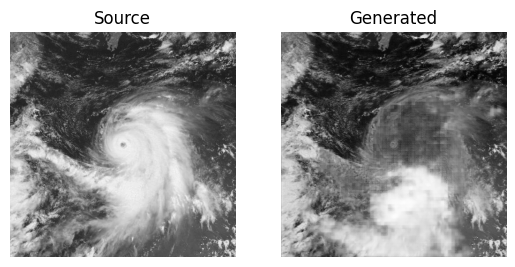

In [ ]:
from keras.models import load_model
from numpy import expand_dims
from matplotlib import pyplot

# Load the trained generator model
model = load_model('/content/model_generator_3000.h5')

# Function to plot source and generated images
def plot_images(src_img, gen_img):
    images = vstack((src_img, gen_img))
    # Scale from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    titles = ['Source', 'Generated']

    # Plot images row by row
    for i in range(len(images)):
        pyplot.subplot(1, 2, 1 + i)
        pyplot.axis('off')
        pyplot.imshow(images[i], cmap='gray')  # Specify cmap='gray' for grayscale images
        pyplot.title(titles[i])
    pyplot.show()

# Load the single new image (replace 'your_image_path.jpg' with the path to your image)
new_image = load_img('/content/new.jpg', color_mode='grayscale', target_size=(512, 512))
new_image = img_to_array(new_image)
# Scale from [0,255] to [-1,1]
new_image = (new_image - 127.5) / 127.5
# Expand dimensions to match the shape expected by the model
new_image = expand_dims(new_image, axis=0)

# Generate image from the new image
gen_image = model.predict(new_image)

# Plot the source and generated images
plot_images(new_image, gen_image)


1/1 [==============================] - 0s 108ms/step


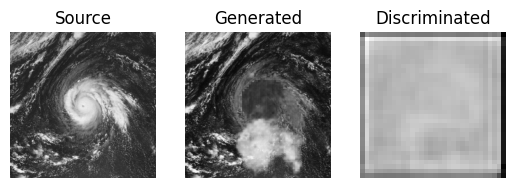

1/1 [==============================] - 0s 26ms/step


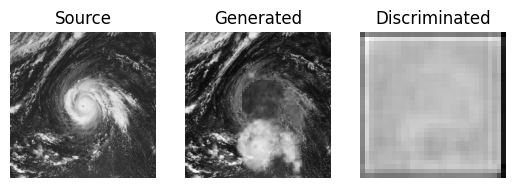

1/1 [==============================] - 0s 20ms/step


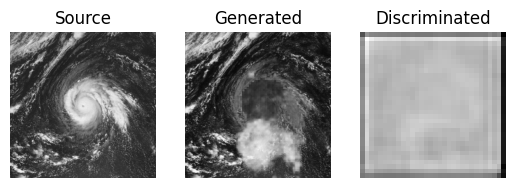

1/1 [==============================] - 0s 20ms/step


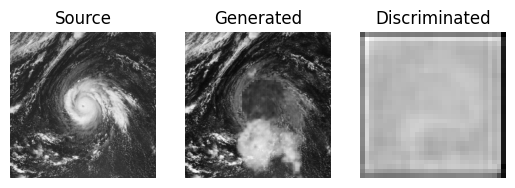

1/1 [==============================] - 0s 20ms/step


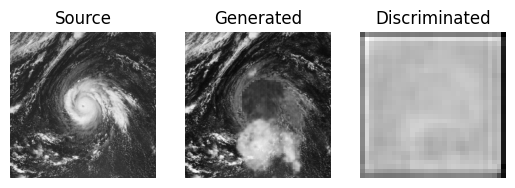

1/1 [==============================] - 0s 24ms/step


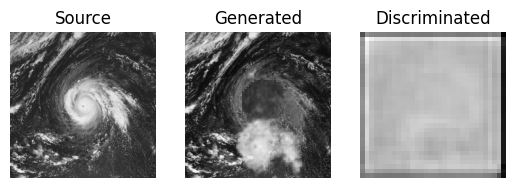

In [ ]:
from keras.models import load_model
from numpy import expand_dims
from matplotlib import pyplot
from tensorflow.keras.optimizers import Adam

# Load the trained generator model
generator_model = load_model('/content/model_generator_3000.h5')

# Discriminator model (you need to replace 'path_to_discriminator_model' with the actual path)
discriminator_model = load_model('/content/model_discriminator_3000.h5')


# Compile the discriminator model
opt = Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])

# Number of iterations
num_iterations = 6

for iteration in range(num_iterations):
    # Generate an image
    new_image = load_img('/content/original image.jpg', color_mode='grayscale', target_size=(512, 512))
    new_image = img_to_array(new_image)
    # Scale from [0,255] to [-1,1]
    new_image = (new_image - 127.5) / 127.5
    # Expand dimensions to match the shape expected by the model
    new_image = expand_dims(new_image, axis=0)

    # Generate image from the new image
    gen_image = generator_model.predict(new_image)

    # Discriminate the generated image
    dis_image = discriminator_model.predict([new_image, gen_image])

    # Plot the source, generated, and discriminated images
    plot_images(new_image, gen_image, dis_image, titles=['Source', 'Generated', 'Discriminated'])

# Train the discriminator with the generated image
    real_labels = np.ones((1, 32, 32, 1))
    fake_labels = np.zeros((1, 32, 32, 1))

    discriminator_model.train_on_batch([new_image, gen_image], real_labels)